# Amazon data exploration

In [1]:
import os
import folium
import itertools
import pandas_alive
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from branca.element import Figure
from matplotlib.patches import Patch
from datetime import datetime, date, timedelta
from collections import defaultdict, OrderedDict
from folium.plugins import FastMarkerCluster, HeatMapWithTime
%matplotlib inline

In [2]:
limits = gpd.read_file('./data/limits/Lim_Biogeografico.shp')
hydro = gpd.read_file('./data/hydro/Hidroeletricas.shp')
mining = gpd.read_file('./data/mining/mineria.shp')
ilegal_mining = gpd.read_file('./data/mining-ilegal/MineriaIlegal_pol.shp')
oil = gpd.read_file('./data/oil/petroleo.shp')
roads = gpd.read_file('./data/roads/vias.shp')
rails = gpd.read_file('./data/roads/vias_ferreas.shp')

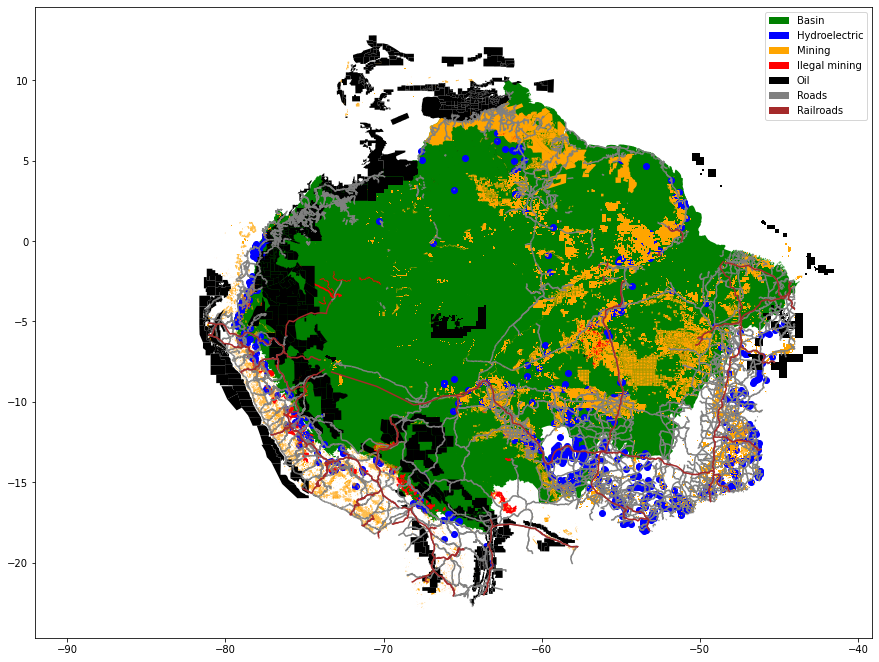

In [3]:
fig, ax = plt.subplots(figsize=(15,15))
legend_elements = [Patch(facecolor='green', label='Basin')
                  , Patch(facecolor='blue', label='Hydroelectric')
                  , Patch(facecolor='orange', label='Mining')
                  , Patch(facecolor='red', label='Ilegal mining')
                  , Patch(facecolor='black', label='Oil')
                  , Patch(facecolor='grey', label='Roads')
                  , Patch(facecolor='brown', label='Railroads')]
limits.plot(ax=ax, color='green',legend=True, label='AAAAA')
hydro.plot(ax=ax, color='blue')
mining.plot(ax=ax, color='orange')
ilegal_mining.plot(ax=ax, color='red')
oil.plot(ax=ax, color='black')
roads.plot(ax=ax, color='grey')
rails.plot(ax=ax, color='brown')
ax.legend(handles=legend_elements)
plt.show()

In [4]:
hydro.head()

,tipo,pais,fonte,pot_mw,leyenda,institucio,limraisg,amzbiog,Empresa,Nombre,estagio,geometry
0,PCH,Brasil,"ANEEL,set/2019",16.8,planeada,ISA,s,n,"Nacional Energia, Participações e Investimento...",Águas Claras,Eixo Inventariado,POINT Z (-54.19134 -15.30357 0.00000)
1,PCH,Brasil,"ANEEL,set/2019",6.0,planeada,ISA,s,n,None,Cachoeira da Usina,Eixo Inventariado,POINT Z (-47.04035 -7.01977 0.00000)
2,UHE,Brasil,"ANEEL,set/2019",250.0,en operación,ISA,s,s,Manaus Transmissora de Energia S.A.,Balbina,Operação,POINT Z (-59.47337 -1.91590 0.00000)
3,PCH,Brasil,"ANEEL,set/2019",17.0,planeada,ISA,s,n,Agropecuária Martinez – Conde Ltda. e Pondera ...,Distância,DRS,POINT Z (-56.04250 -14.19622 0.00000)
4,PCH,Brasil,"ANEEL,set/2019",9.0,en construcción,ISA,s,s,Usina Elétrica do Nhandu S.A.,Rochedo,Construção com Outorga,POINT Z (-55.47528 -9.68528 0.00000)


In [5]:
hydro['leyenda'].value_counts()

planeada           483
en operación       253
en construcción     97
Name: leyenda, dtype: int64

In [6]:
def hydro_markers( r, dest ):
    color = 'lightblue'
    if 'en constru' in r['leyenda']:
        color = 'blue'
    elif 'en opera' in r['leyenda']:
        color = 'darkblue'
    marker = folium.Marker(location=[r.geometry.y, r.geometry.x], popup='<b>{}</b><br> Country: {}, Status: {}'.format(r['Nombre'], r['pais'], r['leyenda']), icon=folium.Icon(color=color))
    marker.add_to( dest )
    return None

In [7]:
fig = Figure(width=720,height=540)
limits_prj = limits.to_crs(epsg=3857)
limits['centroid'] = (limits_prj.centroid).to_crs(epsg=4326)
#creates a zmap centered on the abamzonian basin
m = folium.Map(location=(limits['centroid'].y,limits['centroid'].x), zoom_start=4, tiles = "Stamen Terrain", control_scale=True, prefer_canvas=True)
#adds the amazonian basin limits over the map
sim_geo = gpd.GeoSeries(limits.boundary).simplify(tolerance=0.001)
folium.GeoJson(sim_geo.to_json(), name="Basin").add_to(m)
hydro.apply(lambda x: hydro_markers(x,m), axis=1)
folium.LayerControl().add_to(m)
fig.add_child(m)
m

In [8]:
fig = Figure(width=720,height=540)
m = folium.Map(location=(limits['centroid'].y,limits['centroid'].x), zoom_start=4, tiles = "Stamen Terrain", control_scale=True, prefer_canvas=True)
#adds the amazonian basin limits over the map
sim_geo = gpd.GeoSeries(limits.boundary).simplify(tolerance=0.001)
folium.GeoJson(sim_geo.to_json(), name="Basin").add_to(m)
hydro_cluster = FastMarkerCluster(data=[], name="Hidroelectrics")
hydro.apply(lambda x: hydro_markers(x,hydro_cluster), axis=1)
hydro_cluster.add_to(m)
folium.LayerControl().add_to(m)
fig.add_child(m)
m

In [9]:
fevents21 = gpd.read_file('./data/fire-events/fire_atlas_events_20210712.shp')
fevents21.head()

,cluster_ID,fire_type,confidence,deforestat,tree_cover,biomass,frp,fire_count,size,persistenc,daytime,progressio,biome,region,protected,start_DOY,last_DOY,is_new,is_active,geometry
0,1,1.0,2.0,0.0,30.0,40.5,1.1,1.0,0.31,1.0,1.0,0.0,0.0,0.0,0.0,36.0,36.0,0.0,0.0,"POLYGON ((-84.76500 10.00000, -84.76000 10.000..."
1,2,2.0,3.0,0.0,57.0,24.0,16.3,1.0,0.31,1.0,1.0,0.0,0.0,0.0,0.0,94.0,94.0,0.0,0.0,"POLYGON ((-84.31500 10.00000, -84.31000 10.000..."
2,3,1.0,3.0,0.0,17.0,24.3,6.0,3.0,0.93,1.0,1.0,0.0,0.0,0.0,0.0,71.0,71.0,0.0,0.0,"POLYGON ((-84.30500 10.00000, -84.29500 10.000..."
3,4,1.0,3.0,0.0,3.0,42.2,5.3,2.0,0.31,1.0,1.0,0.0,0.0,0.0,0.0,55.0,67.0,0.0,0.0,"POLYGON ((-84.25000 10.00000, -84.24500 10.000..."
4,5,1.0,3.0,0.0,4.0,0.0,2.0,8.0,0.31,2.0,0.0,0.0,0.0,0.0,0.0,17.0,89.0,0.0,0.0,"POLYGON ((-84.23500 10.00000, -84.23000 10.000..."


In [10]:
fevents21.describe()

,cluster_ID,fire_type,confidence,deforestat,tree_cover,biomass,frp,fire_count,size,persistenc,daytime,progressio,biome,region,protected,start_DOY,last_DOY,is_new,is_active
count,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224669.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000,224683.000000
mean,112342.000000,1.292274,2.687075,0.005164,29.360276,57.964474,6.933015,3.571289,0.644396,1.024617,0.853011,0.008224,0.394071,4.750422,0.123616,91.419208,96.270069,0.011750,0.094026
std,64860.539604,0.555208,0.600630,0.065688,29.974989,78.425774,8.654591,17.955420,1.217052,0.191584,0.354096,0.056119,0.739945,7.076680,0.328408,56.608790,56.843876,0.107758,0.291865
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.310000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,56171.500000,1.000000,3.000000,0.000000,3.000000,3.300000,3.200000,1.000000,0.310000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,45.000000,50.000000,0.000000,0.000000
50%,112342.000000,1.000000,3.000000,0.000000,18.170000,19.700000,5.000000,1.000000,0.310000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,83.000000,88.000000,0.000000,0.000000
75%,168512.500000,2.000000,3.000000,0.000000,50.500000,92.800000,7.900000,3.000000,0.620000,1.000000,1.000000,0.000000,0.000000,9.000000,0.000000,140.000000,147.000000,0.000000,0.000000
max,224683.000000,4.000000,3.000000,1.000000,100.000000,480.100000,598.600000,4205.000000,150.040000,9.000000,1.000000,0.980000,3.000000,21.000000,1.000000,193.000000,193.000000,1.000000,1.000000


In [11]:
fires_2021 = fevents21.loc[fevents21['biome'] == 1][['geometry','start_DOY','last_DOY','fire_type','size']]

In [12]:
days_map = {}
#Populates a map with a key per day with a list of the centroids of the fires that are active 
for day in fires_2021['start_DOY'].sort_values().unique(): 
    df = fires_2021.loc[fires_2021['start_DOY'] == day]
    for _,r in df.iterrows():
        for d in range(0,int(r['last_DOY'] - r['start_DOY'])+1):
            k = (date(2021, 1, 1) + timedelta(days=(int(day+d) - 1)))
            if k not in days_map:
                days_map[k] = []
            days_map[k].append( [r['geometry'].centroid.y, r['geometry'].centroid.x] )
days_map = OrderedDict(sorted(days_map.items(), key=lambda t: t[0]))

In [13]:
fig = Figure(width=720,height=540)
m = folium.Map(location=(limits['centroid'].y,limits['centroid'].x), zoom_start=4, tiles = "Stamen Terrain", control_scale=True, prefer_canvas=True)
#adds the amazonian basin limits over the map
sim_geo = gpd.GeoSeries(limits.boundary).simplify(tolerance=0.001)
folium.GeoJson(sim_geo.to_json(), name="Basin").add_to(m)

hm = HeatMapWithTime(data=list(days_map.values()),
                     index=[d.strftime("%d-%m-%Y") for d in days_map.keys()], 
                     name='Fires 2021',
                     radius=10,
                     auto_play=True,
                     max_opacity=0.3,
                     min_speed=10,
                     max_speed=24,
                     speed_step=1)
hm.add_to(m)
folium.LayerControl().add_to(m)
fig.add_child(m)
m

In [14]:
fires_2021['date_range'] = fires_2021.apply(lambda x: [(date(2021, 1, 1) + timedelta(days=(d) - 1)) for d in range(int(x['start_DOY']), int(x['last_DOY'])+1)] , axis=1)
fires_2021.loc[fires_2021.start_DOY == 193].head()

,geometry,start_DOY,last_DOY,fire_type,size,date_range
79307,"POLYGON ((-60.65500 4.75500, -60.65000 4.75500...",193.0,193.0,1.0,0.31,[2021-07-12]
103382,"POLYGON ((-46.73500 -1.01000, -46.73000 -1.010...",193.0,193.0,2.0,0.31,[2021-07-12]
103397,"POLYGON ((-47.63000 -1.03000, -47.62500 -1.030...",193.0,193.0,1.0,0.31,[2021-07-12]
103468,"POLYGON ((-46.61000 -1.11500, -46.60500 -1.115...",193.0,193.0,2.0,0.31,[2021-07-12]
103556,"POLYGON ((-48.00000 -1.23000, -47.99500 -1.230...",193.0,193.0,1.0,0.31,[2021-07-12]


In [15]:
fires_2021 = fires_2021.explode('date_range')
fires_2021.head()

,geometry,start_DOY,last_DOY,fire_type,size,date_range
76302,"POLYGON ((-60.40000 5.14500, -60.39500 5.14500...",80.0,80.0,2.0,0.31,2021-03-21
76303,"POLYGON ((-60.39500 5.14500, -60.39000 5.14500...",70.0,70.0,2.0,0.31,2021-03-11
76368,"POLYGON ((-60.59000 5.13500, -60.58500 5.13500...",80.0,80.0,2.0,0.31,2021-03-21
76474,"POLYGON ((-60.44500 5.11500, -60.44000 5.11500...",111.0,111.0,2.0,0.31,2021-04-21
76501,"POLYGON ((-60.41000 5.11000, -60.40500 5.11000...",80.0,80.0,2.0,0.31,2021-03-21


In [16]:
def build_df(x):
    row = {'date':x['date_range'], 'type 1':0, 'type 2':0, 'type 3':0, 'type 4':0}
    row['type %i' % int(x['fire_type'])] = x['size']
    return row

df_bar_race = pd.DataFrame(pd.DataFrame(fires_2021.groupby(['date_range','fire_type'])['size'].count().reset_index())
.apply(lambda x: build_df(x), axis=1).values.tolist())
df_bar_race = pd.DataFrame(df_bar_race.groupby('date').sum())
df_bar_race.head()

,type 1,type 2,type 3,type 4
date,,,,
2021-01-01,60,39,1,12
2021-01-02,155,111,3,24
2021-01-03,76,37,4,17
2021-01-04,82,59,4,22
2021-01-05,125,76,4,25


<AxesSubplot:title={'center':'Fires per day 2021'}, xlabel='date'>

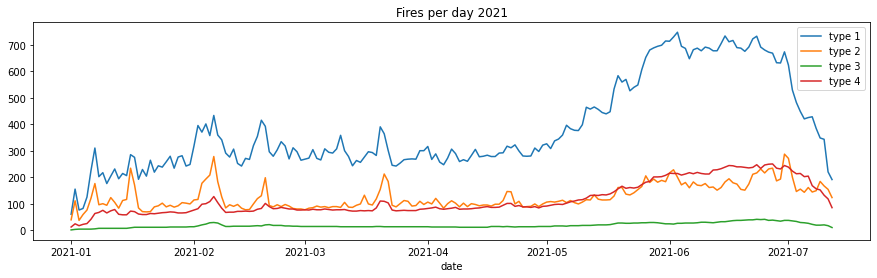

In [17]:
df_bar_race.plot(figsize=(15,4), title='Fires per day 2021')